<a href="https://colab.research.google.com/github/R-Rakib/Cat-vs-dog-Classifier/blob/main/PPE%20Detection%20using%20yolo11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 870.5/870.5 kB 45.1 MB/s eta 0:00:00


In [ ]:
!nvidia-smi

Mon Oct 14 17:26:22 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   51C    P8              12W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [3]:
from ultralytics import YOLO
from IPython.display import Image

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [6]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="T8bmtUPgQjpkXG1XBkdW")
project = rf.workspace("project-uyrxf").project("ppe_detection-v1x3l")
version = project.version(2)
dataset = version.download("yolov11")


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to PPE_Detection-2 in yolov11:: 100%|██████████| 6472/6472 [00:01<00:00, 5336.46it/s]


In [7]:
dataset.location

'/content/PPE_Detection-2'

In [10]:
!yolo task=detect mode=train data={dataset.location}/data.yaml model="yolo11n.pt" epochs=50 imgsz=640

Ultralytics 8.3.13 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolo11n.pt, data=/content/PPE_Detection-2/data.yaml, epochs=50, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train2, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, s

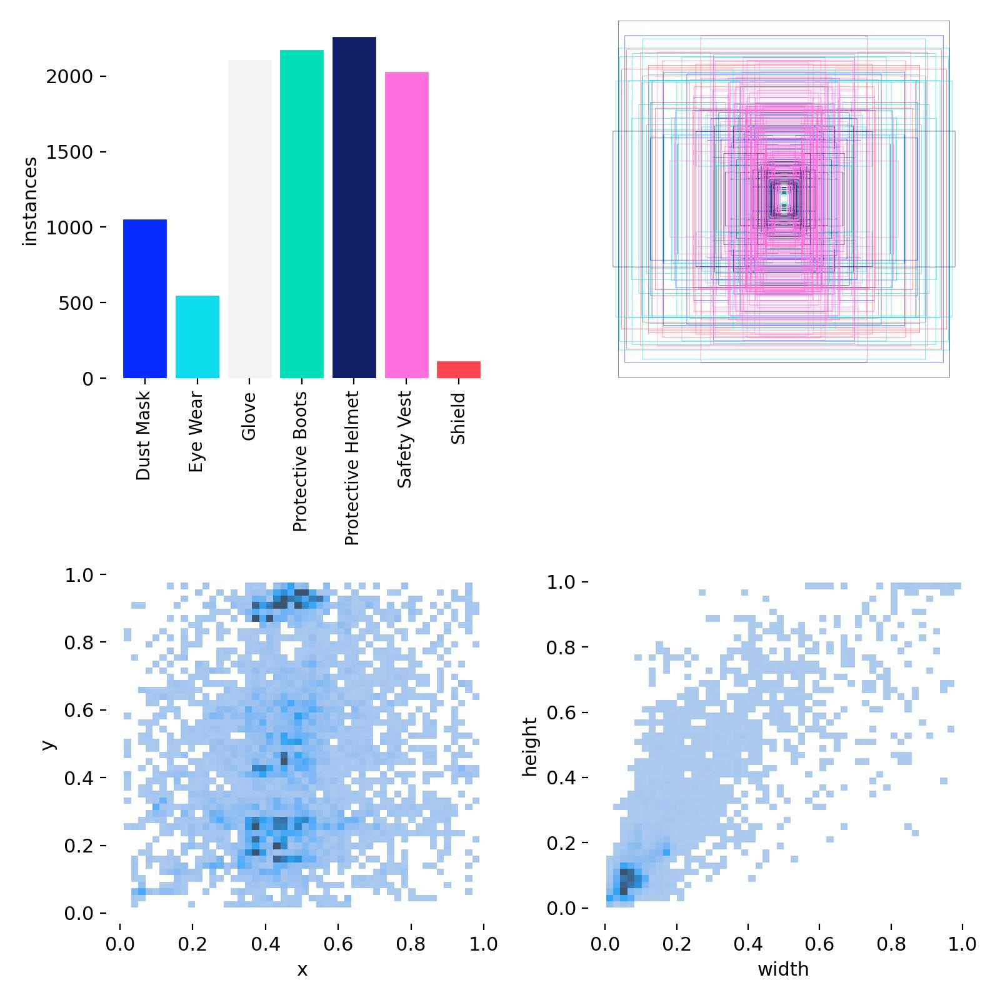

In [12]:
Image('/content/runs/detect/train2/labels.jpg',width=600)

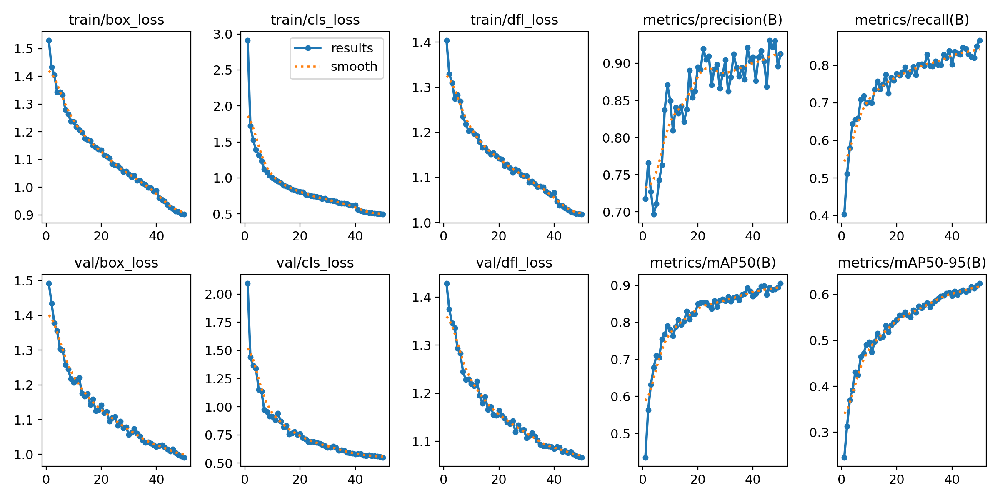

In [13]:
Image('/content/runs/detect/train2/results.png',width=600)

In [14]:
!yolo task=detect mode=val model='/content/runs/detect/train2/weights/best.pt' data={dataset.location}/data.yaml

Ultralytics 8.3.13 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs
val: Scanning /content/PPE_Detection-2/valid/labels.cache... 637 images, 0 backgrounds, 0 corrupt: 100% 637/637 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 40/40 [00:09<00:00,  4.11it/s]
                   all        637       3064      0.913      0.867      0.904      0.624
             Dust Mask        299        308      0.959      0.913      0.957      0.672
              Eye Wear        146        147       0.89      0.762      0.826      0.467
                 Glove        346        631      0.967      0.878      0.939       0.67
      Protective Boots        298        608      0.954      0.957      0.979      0.698
     Protective Helmet        403        753      0.953      0.959      0.981      0.756
           Safety Vest        359        592  

In [16]:
!yolo task=detect mode=predict model="/content/runs/detect/train2/weights/best.pt" conf=0.25 source={dataset.location}/test/images save=True

Ultralytics 8.3.13 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs

image 1/322 /content/PPE_Detection-2/test/images/000446_jpg.rf.63a960737ed4b762294eea1ad1a92791.jpg: 640x640 1 Glove, 2 Protective Helmets, 12.1ms
image 2/322 /content/PPE_Detection-2/test/images/20220721_161946_jpg.rf.905c375aa964159f9edab2a55a6e7476.jpg: 640x640 2 Dust Masks, 8.9ms
image 3/322 /content/PPE_Detection-2/test/images/20220721_162015_jpg.rf.ccb5d8a5aed0bb50c04431fa0b0d5479.jpg: 640x640 1 Dust Mask, 8.0ms
image 4/322 /content/PPE_Detection-2/test/images/20220721_162036_jpg.rf.2664c2f59604cd2380a51fd174055a7e.jpg: 640x640 1 Dust Mask, 1 Glove, 9.3ms
image 5/322 /content/PPE_Detection-2/test/images/20220721_162308_jpg.rf.913971a6c64f38eabc6b69bab4409b46.jpg: 640x640 2 Eye Wears, 1 Protective Helmet, 1 Shield, 7.9ms
image 6/322 /content/PPE_Detection-2/test/images/20220721_162435_jpg.rf.d478427044384d4e32ba0c25b1

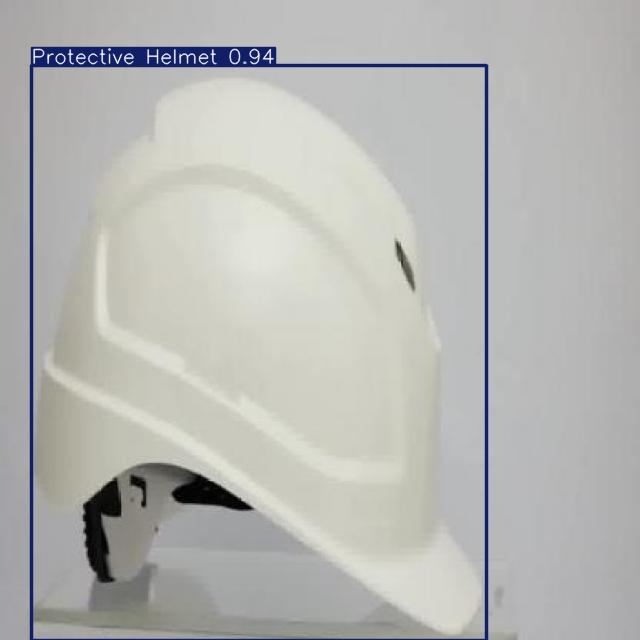

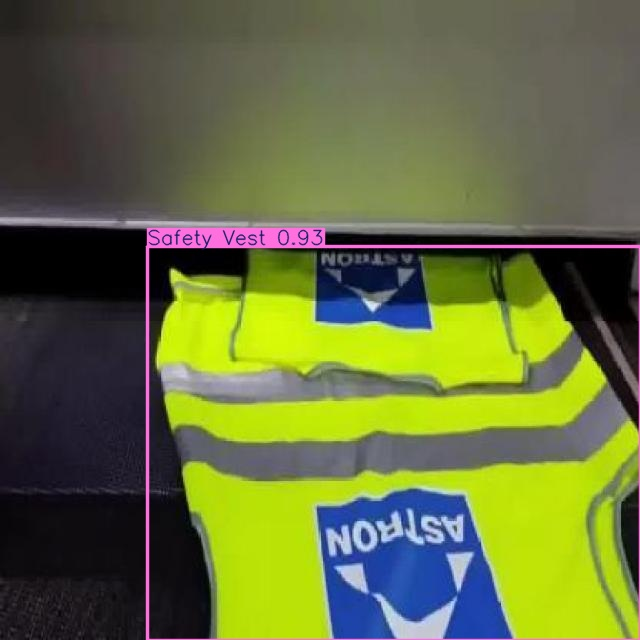

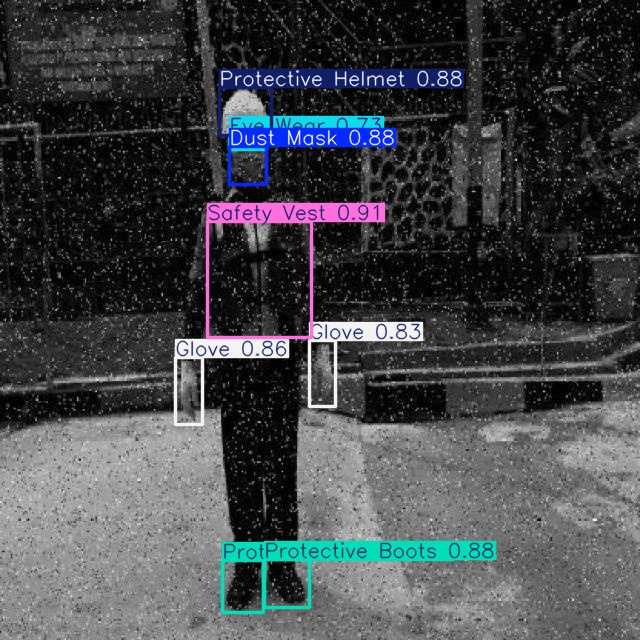

In [17]:
import glob
import os
from IPython.display import Image as IPyImage, display

latest_folder = max(glob.glob('/content/runs/detect/predict*/'), key=os.path.getmtime)
for img in glob.glob(f'{latest_folder}/*.jpg')[1:4]:
    display(IPyImage(filename=img, width=600))
    print("\n")

In [21]:
!yolo task=detect mode=predict model="/content/runs/detect/train2/weights/best.pt" conf=0.25 source=/content/PPE_Part1.mp4 save=True

Ultralytics 8.3.13 🚀 Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLO11n summary (fused): 238 layers, 2,583,517 parameters, 0 gradients, 6.3 GFLOPs

video 1/1 (frame 1/310) /content/PPE_Part1.mp4: 384x640 1 Protective Helmet, 4 Safety Vests, 51.0ms
video 1/1 (frame 2/310) /content/PPE_Part1.mp4: 384x640 2 Protective Helmets, 4 Safety Vests, 16.9ms
video 1/1 (frame 3/310) /content/PPE_Part1.mp4: 384x640 2 Protective Helmets, 4 Safety Vests, 9.7ms
video 1/1 (frame 4/310) /content/PPE_Part1.mp4: 384x640 2 Protective Helmets, 4 Safety Vests, 11.8ms
video 1/1 (frame 5/310) /content/PPE_Part1.mp4: 384x640 2 Protective Helmets, 4 Safety Vests, 13.2ms
video 1/1 (frame 6/310) /content/PPE_Part1.mp4: 384x640 2 Protective Helmets, 4 Safety Vests, 12.8ms
video 1/1 (frame 7/310) /content/PPE_Part1.mp4: 384x640 3 Protective Helmets, 4 Safety Vests, 13.5ms
video 1/1 (frame 8/310) /content/PPE_Part1.mp4: 384x640 3 Protective Helmets, 4 Safety Vests, 13.0ms
video 1/1 (frame 9/310) /con

In [24]:
!gdown "https://drive.google.com/uc?id=1Nyl18zr7zOJHh8uHtSic3dsJSY4LI_t-&confirm=t"

Downloading...
From: https://drive.google.com/uc?id=1Nyl18zr7zOJHh8uHtSic3dsJSY4LI_t-&confirm=t
To: /content/PPE_Part1.mp4
100% 14.2M/14.2M [00:00<00:00, 124MB/s]


In [23]:
from IPython.display import HTML
from base64 import b64encode
import os

# Input video path
save_path = '/content/runs/detect/predict3/PPE_Part1.avi'

# Compressed video path
compressed_path = "/content/result_compressed.mp4"

os.system(f"ffmpeg -i {save_path} -vcodec libx264 {compressed_path}")

# Show video
mp4 = open(compressed_path,'rb').read()
data_url = "data:video/mp4;base64," + b64encode(mp4).decode()
# The original code was missing a format specifier in the HTML string.
# We need to add a `<video>` tag with a `src` attribute that will use the data_url.
# We also need to add controls to the video tag so the user can play/pause it.
# We use f-strings for modern string formatting for clarity and ease of use
HTML(f"""
<video width=600 controls>
    <source src="{data_url}" type="video/mp4">
</video>
""")